In [1]:
import pandas as pd
import numpy as np
import time
%matplotlib inline
import matplotlib.pyplot as plt  # Matlab-style plotting
import seaborn as sns
color = sns.color_palette()
sns.set_style('darkgrid')
import warnings
def ignore_warn(*args, **kwargs):
    pass
warnings.warn = ignore_warn
#显示所有列
pd.set_option('display.max_columns', None)
#显示所有行
pd.set_option('display.max_rows', None)
#设置value的显示长度为100，默认为50
pd.set_option('max_colwidth',100)

In [2]:
# startt = time.time()
# reader = pd.read_csv('totalExposureLog.out', iterator=True, sep='\t', header = None, names = ['广告请求 id','广告请求时间','广告位 id','用户 id','曝光广告 id',
#                                             '曝光广告素材尺寸','曝光广告出价 bid','曝光广告 pctr','曝光广告 quality_ecpm','曝光广告 totalEcpm'])
# try:
#     df = reader.get_chunk(10000000)
# except StopIteration:
#     print ("Iteration is stopped.")
# endt = time.time()
# time_elapsed = endt - startt
# print('complete in {:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60)) # 打印出来时间
# df.head(20)
# 读取全部数据
loop = True
reader = pd.read_csv('totalExposureLog.out', iterator=True, sep='\t', header = None, names = ['广告请求 id','广告请求时间','广告位 id','用户 id','曝光广告 id',
                                            '曝光广告素材尺寸','曝光广告出价 bid','曝光广告 pctr','曝光广告 quality_ecpm','曝光广告 totalEcpm'])
chunkSize = 100000
chunks = []
while loop:
    try:
        chunk = reader.get_chunk(chunkSize)
        chunks.append(chunk)
    except StopIteration:
        loop = False
        print ("Iteration is stopped.")
df2 = pd.concat(chunks, ignore_index=True)

complete in 0m 12s


,广告请求 id,广告请求时间,广告位 id,用户 id,曝光广告 id,曝光广告素材尺寸,曝光广告出价 bid,曝光广告 pctr,曝光广告 quality_ecpm,曝光广告 totalEcpm
0,53991770,1550409746,94,1160618,451525,50,46,47.217,944.34,3122.340
1,25942318,1550370892,79,203814,214797,64,10,49.094,981.88,1471.880
2,66156247,1550416600,18,808543,92253,40,96,3.824,76.48,443.584
3,5935886,1550365898,198,7270,160082,64,85,6.123,122.46,642.915
4,11624425,1550361159,168,852707,253902,64,60,4.329,86.58,346.320
5,87085212,1550406108,209,794015,126362,64,236,13.914,278.28,3561.984
6,13220086,1550412325,320,228155,307878,64,107,7.538,150.76,957.326
7,86036534,1550366402,39,1089376,324657,44,31,18.965,379.30,966.300
8,14581426,1550333073,297,601634,427309,64,42,21.066,421.32,1306.092
9,35294027,1550379093,297,1373800,608799,64,12,7.194,143.88,230.208


In [3]:
df.shape

(10000000, 10)

In [49]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9914161 entries, 0 to 9999999
Data columns (total 11 columns):
广告请求 id              int64
广告请求时间               int64
广告位 id               int64
用户 id                int64
曝光广告 id              int64
曝光广告素材尺寸             int64
曝光广告出价 bid           int64
曝光广告 pctr            float64
曝光广告 quality_ecpm    float64
曝光广告 totalEcpm       float64
广告请求时间改              object
dtypes: float64(3), int64(7), object(1)
memory usage: 1.2+ GB


In [7]:
# 删除重复数据
df.drop_duplicates(subset=None, keep='first', inplace=True)

In [8]:
df.shape

(9914161, 10)

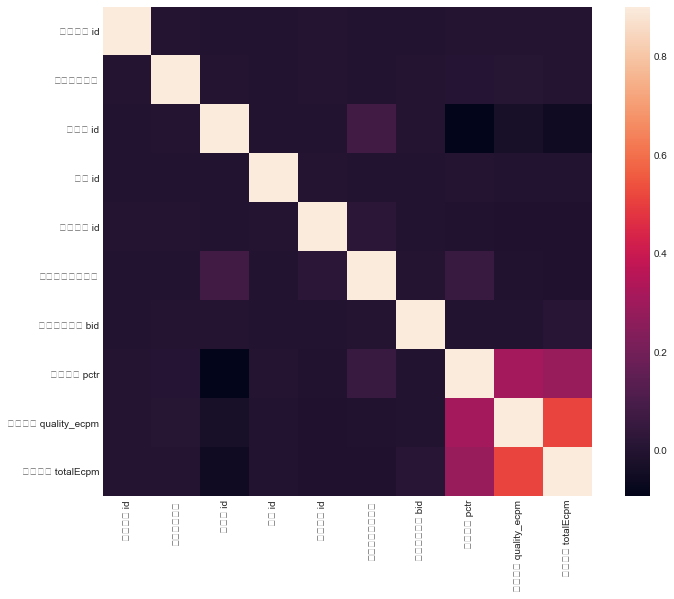

In [10]:
#Correlation map to see how features are correlated with SalePrice
corrmat = df.corr()
plt.subplots(figsize=(12,9))
sns.heatmap(corrmat, vmax=0.9, square=True)

In [ ]:
df['广告请求时间改'] = df['广告请求时间'].apply(lambda x:time.strftime('%Y/%m/%d %H:%M:%S',time.localtime(x)))

In [38]:
df['广告请求时间改'].max()

'2019/02/19 23:58:39'

In [39]:
df['广告请求时间改'].min()

'2019/02/16 22:59:27'

In [13]:
df['广告请求时间改'].value_counts()

2019/02/18 09:54:35    100
2019/02/17 10:24:31    100
2019/02/18 12:10:34     99
2019/02/18 12:42:29     99
2019/02/18 21:57:32     98
2019/02/18 22:48:37     98
2019/02/17 11:46:14     98
2019/02/18 12:22:07     97
2019/02/17 22:43:50     97
2019/02/18 20:09:04     97
2019/02/18 10:00:59     96
2019/02/17 10:26:34     96
2019/02/18 22:16:45     96
2019/02/18 21:44:09     96
2019/02/18 11:01:26     96
2019/02/18 11:09:06     95
2019/02/17 21:49:23     95
2019/02/18 13:05:54     95
2019/02/17 14:04:47     95
2019/02/18 22:52:36     95
2019/02/18 12:03:22     94
2019/02/18 12:08:55     93
2019/02/17 22:42:38     93
2019/02/18 10:34:55     93
2019/02/18 12:30:22     93
2019/02/17 21:59:48     93
2019/02/18 12:52:13     93
2019/02/17 11:35:16     93
2019/02/17 12:44:41     92
2019/02/17 22:26:15     92
2019/02/17 10:16:04     92
2019/02/18 22:01:56     92
2019/02/18 22:21:04     92
2019/02/18 22:09:50     92
2019/02/18 22:28:57     92
2019/02/17 16:55:05     92
2019/02/17 09:17:58     92
2

In [17]:
df[df['广告请求时间改']=='2019/02/18 09:54:35']

,广告请求 id,广告请求时间,广告位 id,用户 id,曝光广告 id,曝光广告素材尺寸,曝光广告出价 bid,曝光广告 pctr,曝光广告 quality_ecpm,曝光广告 totalEcpm,广告请求时间改
3654034,46196365,1550454875,265,933831,544657,1,534,4.04800,80.96000,2242.59200,2019/02/18 09:54:35
3659009,74714135,1550454875,123,1136021,37658,14,95,14.02500,280.50000,1612.87500,2019/02/18 09:54:35
3675332,82131615,1550454875,107,1137086,239450,14,45,16.93800,338.76000,1100.97000,2019/02/18 09:54:35
3750072,42892676,1550454875,209,641228,721133,64,29,6.78900,135.78000,331.78000,2019/02/18 09:54:35
3762827,17711391,1550454875,168,130378,383317,14,39,2.42600,48.52000,143.13400,2019/02/18 09:54:35
3835064,89477042,1550454875,123,985031,474094,64,46,11.00600,220.12000,726.39600,2019/02/18 09:54:35
3861752,75084860,1550454875,209,1091353,314334,64,218,7.36300,147.26000,1752.39400,2019/02/18 09:54:35
3873394,59032539,1550454875,25,1125612,560590,30,149,0.91800,18.36000,155.14200,2019/02/18 09:54:35
3880475,22004948,1550454875,122,82705,247328,64,205,2.71000,54.20000,609.75000,2019/02/18 09:54:35
3889685,41937385,1550454875,123,197897,723937,64,310,31.42500,628.50000,10370.25000,2019/02/18 09:54:35


In [18]:
df[df['广告请求时间改']=='2019/02/18 09:54:35']['广告请求 id'].value_counts()

32259595    3
90424636    2
74714135    2
34912054    2
89477042    2
13538862    2
61562691    2
37630022    2
93178825    2
92098637    2
47282253    2
22004948    2
66182872    2
59032539    2
82131615    2
72754270    2
25950549    2
41937385    2
94192796    2
14422549    2
43022562    2
77265302    1
13023478    1
42892676    1
11985717    1
22201869    1
31868719    1
43220620    1
46196365    1
43642729    1
84806698    1
87974869    1
15683887    1
13722361    1
32508789    1
10726945    1
59272451    1
46141970    1
25587614    1
34911059    1
36069661    1
45654091    1
5557530     1
50450617    1
65439968    1
53521021    1
65201339    1
75084860    1
89543801    1
97813880    1
12876791    1
8685430     1
426613      1
18305267    1
73124067    1
11119600    1
77203309    1
20263528    1
19248613    1
14684772    1
57793112    1
28208616    1
7640545     1
52418272    1
61767181    1
15408093    1
61890396    1
45346010    1
82968452    1
25340499    1
31614539    1
181983

In [20]:
df[df['广告请求时间改']=='2019/02/18 09:54:35'][df['广告请求 id']==32259595]

,广告请求 id,广告请求时间,广告位 id,用户 id,曝光广告 id,曝光广告素材尺寸,曝光广告出价 bid,曝光广告 pctr,曝光广告 quality_ecpm,曝光广告 totalEcpm,广告请求时间改
5583956,32259595,1550454875,47,1022193,34603,36,184,4.096,81.92,834.920,2019/02/18 09:54:35
6304051,32259595,1550454875,156,1022193,245639,14,77,23.489,469.78,2278.433,2019/02/18 09:54:35
6889944,32259595,1550454875,258,1022193,247184,14,107,10.873,217.46,1380.871,2019/02/18 09:54:35


In [41]:
subfeatures = ['广告请求 id','广告请求时间','广告位 id','用户 id','曝光广告 id',
                                            '曝光广告素材尺寸','曝光广告出价 bid','曝光广告 pctr','曝光广告 quality_ecpm','曝光广告 totalEcpm']

In [47]:
stats = []
for feature in subfeatures:
    stats.append((feature,df[feature].nunique(),df[feature].value_counts().values[0],df[feature].dtype))
stats_df = pd.DataFrame(stats, columns=['Feature', 'Unique_values', 'values in the biggest category', 'type'])
stats_df

,Feature,Unique_values,values in the biggest category,type
0,广告请求 id,8325318,20,int64
1,广告请求时间,260284,100,int64
2,广告位 id,265,961728,int64
3,用户 id,701329,1536,int64
4,曝光广告 id,86713,44418,int64
5,曝光广告素材尺寸,50,3792250,int64
6,曝光广告出价 bid,10016,309098,int64
7,曝光广告 pctr,294170,2934,float64
8,曝光广告 quality_ecpm,315177,123574,float64
9,曝光广告 totalEcpm,1988233,1193,float64


In [37]:
df.groupby('广告位 id')['曝光广告 totalEcpm'].mean()

广告位 id
1        7583.369290
2        7095.400252
3        1789.143455
4         337.800216
5         969.370865
10       4399.819828
11        428.049150
12       1281.360223
13        636.660449
14       2398.545361
15        473.403879
17       7839.683921
18       3040.135125
20       2212.462708
21        382.960967
22        401.964267
23        513.753711
24        416.613227
25        477.686336
27       1449.830964
28       1125.507626
29        656.656079
30       1462.781340
31        282.020226
34        472.818408
36        957.114943
37       4168.687202
38       1447.532157
39       2567.792058
40        346.100954
41       4152.961159
42      14734.415556
43       2892.862951
44        465.467998
46     110718.417125
47       1621.152237
48        425.777193
50       3063.352260
51       1341.254900
52       1505.974427
53       7264.335238
54        586.531037
56       3099.348237
57       4454.706667
58       3019.575452
59       1460.774269
60       7213.895031
62    

In [35]:
df.groupby('曝光广告素材尺寸')['广告位 id'].value_counts()

曝光广告素材尺寸  广告位 id
1         265       311357
          239        56593
          134        18569
          175         8927
          91          8716
          79          6076
          277         2302
          120         2285
          149         1565
          121          869
          104          554
          22           362
          36           312
          158          293
3         315         4674
4         97            10
5         94          2128
9         94          2831
10        209         1800
          217           12
11        134         6632
          22          1015
12        135         2942
          31           646
14        123       112354
          257        59888
          168        48360
          198        42035
          107        41946
          30         26666
          247        12632
          142         9089
          156         8015
          91          7768
          79          5981
          228         5843
          2

In [ ]:
# pd.sort_values("xxx",inplace=True)

In [68]:
try:
    df2 = reader.get_chunk(10000000)
except StopIteration:
    print ("Iteration is stopped.")
endt = time.time()
time_elapsed = endt - startt
print('complete in {:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60)) # 打印出来时间
df2.head(20)

complete in 335m 24s


,广告请求 id,广告请求时间,广告位 id,用户 id,曝光广告 id,曝光广告素材尺寸,曝光广告出价 bid,曝光广告 pctr,曝光广告 quality_ecpm,曝光广告 totalEcpm
20000000,12308414,1550799274,315,271231,386816,34,37,8.769,175.38,499.833
20000001,30134690,1550835339,199,156578,294580,36,50,12.149,242.98,849.980
20000002,90814234,1550847734,209,889560,626446,64,19,4.946,98.92,192.894
20000003,84043562,1550829041,25,589684,403332,30,10,2.143,42.86,64.290
20000004,43221180,1550795779,123,1261736,539118,64,68,13.424,268.48,1181.312
20000005,6215965,1550793805,123,472991,207848,14,114,30.023,600.46,4023.082
20000006,51580645,1550828552,199,546547,460048,64,98,24.846,496.92,2931.828
20000007,62407724,1550793060,123,77103,471514,14,92,8.414,168.28,942.368
20000008,42530183,1550804444,247,1099416,26554,14,70,8.092,161.84,728.280
20000009,78497938,1550816098,209,763171,614988,64,92,4.206,0.00,386.952


In [69]:
# 删除重复数据
df2.drop_duplicates(subset=None, keep='first', inplace=True)

In [70]:
df2.head()

,广告请求 id,广告请求时间,广告位 id,用户 id,曝光广告 id,曝光广告素材尺寸,曝光广告出价 bid,曝光广告 pctr,曝光广告 quality_ecpm,曝光广告 totalEcpm
20000000,12308414,1550799274,315,271231,386816,34,37,8.769,175.38,499.833
20000001,30134690,1550835339,199,156578,294580,36,50,12.149,242.98,849.980
20000002,90814234,1550847734,209,889560,626446,64,19,4.946,98.92,192.894
20000003,84043562,1550829041,25,589684,403332,30,10,2.143,42.86,64.290
20000004,43221180,1550795779,123,1261736,539118,64,68,13.424,268.48,1181.312


In [71]:
df2.shape

(9915168, 10)

In [72]:
df2['广告请求时间改'] = df2['广告请求时间'].apply(lambda x:time.strftime('%Y/%m/%d %H:%M:%S',time.localtime(x)))

In [73]:
df2['广告请求时间改'].max()

'2019/02/25 23:58:45'

In [74]:
df2['广告请求时间改'].min()

'2019/02/21 22:59:37'

In [75]:
df2.head(1000)

,广告请求 id,广告请求时间,广告位 id,用户 id,曝光广告 id,曝光广告素材尺寸,曝光广告出价 bid,曝光广告 pctr,曝光广告 quality_ecpm,曝光广告 totalEcpm,广告请求时间改
20000000,12308414,1550799274,315,271231,386816,34,37,8.7690,175.3800,499.83300,2019/02/22 09:34:34
20000001,30134690,1550835339,199,156578,294580,36,50,12.1490,242.9800,849.98000,2019/02/22 19:35:39
20000002,90814234,1550847734,209,889560,626446,64,19,4.9460,98.9200,192.89400,2019/02/22 23:02:14
20000003,84043562,1550829041,25,589684,403332,30,10,2.1430,42.8600,64.29000,2019/02/22 17:50:41
20000004,43221180,1550795779,123,1261736,539118,64,68,13.4240,268.4800,1181.31200,2019/02/22 08:36:19
20000005,6215965,1550793805,123,472991,207848,14,114,30.0230,600.4600,4023.08200,2019/02/22 08:03:25
20000006,51580645,1550828552,199,546547,460048,64,98,24.8460,496.9200,2931.82800,2019/02/22 17:42:32
20000007,62407724,1550793060,123,77103,471514,14,92,8.4140,168.2800,942.36800,2019/02/22 07:51:00
20000008,42530183,1550804444,247,1099416,26554,14,70,8.0920,161.8400,728.28000,2019/02/22 11:00:44
20000009,78497938,1550816098,209,763171,614988,64,92,4.2060,0.0000,386.95200,2019/02/22 14:14:58
